# Introduction


PayBuddy is an online payments platform based out of the U.S.

Its an Online Payments Platform that was split from PayBay in 2015 and became an independent company. The current CEO of the company is Michael.
Michael hosts a diverse portfolio of credit products like credit card, pay later etc.
PayBuddy facilitates money transfer service for free of cost between any two PayBuddy users.

To ensure competitive advantage over competing brands, the company needs to build a propensity model to predict the customer propensity to apply for the new line of credit card called Evolution Card.
This would enable the following things

* Increase net TPV and adoption of Evolution
* Provide optimal incentives and rewards
* Optimal customer targeting
* Minimize credit risks

PayBuddy has decided to conduct a hackathon to invite submissions and ideas to help build this model. The focus would be on training a model that is able to give a benchmarking performance.

Since the Evolution card is very new and was launched only at the beginning of 2021, we have limited data for about 6-month time. The benchmarking metric would be the KS score on PayBuddy’s internal test data.

Since Evolution is a cobrand card, there could be customerss who are not already existing customers of PayBuddy. Hence, it is advised to model PayBuddy and non- PayBuddy customers separately because PayBuddy customers might have an additional set of features derived from internal PayBuddy data that can improve model performance further. These features will not be present for customers who are not existing customers of PayBuddy.

## Data Frames given:

* Cashout features &#8594; Withdrawal based features
* new_acct_memo_rcv &#8594; received transaction based features
* new_acct_fi &#8594; financial instrument based features
* new_acct_memo_sent &#8594; emoji based features
* new_acct_receiver &#8594; Sender engagement features
* new_acct_sender &#8594; Receiver engagement features
* payment_cashout_fail &#8594; Failed withdrawal features
* train_df &#8594; Training Dataset
* test_cust_id &#8594; Testing Dataset

# Part 1: Exploratory Data Analysis

### Loading Data Frames

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
fraud_update_features = pd.read_csv('/content/drive/MyDrive/MS4610/fraud_update_features.csv', index_col=False)
new_acct_fi = pd.read_csv('/content/drive/MyDrive/MS4610/new_acct_fi.csv', index_col=False)
new_acct_memo_rcv = pd.read_csv('/content/drive/MyDrive/MS4610/new_acct_memo_rcv.csv', index_col=False)
new_acct_memo_sent = pd.read_csv('/content/drive/MyDrive/MS4610/new_acct_memo_sent.csv', index_col=False)
new_acct_receiver = pd.read_csv('/content/drive/MyDrive/MS4610/new_acct_receiver_1.csv', index_col=False)
new_acct_sender = pd.read_csv('/content/drive/MyDrive/MS4610/new_acct_sender.csv', index_col=False)
payment_cashout_fail_df = pd.read_csv('/content/drive/MyDrive/MS4610/payment_cashout_fail_df.csv', index_col=False)
test_cust_id = pd.read_csv('/content/drive/MyDrive/MS4610/test_cust_id.csv', index_col=False)
train_df = pd.read_csv('/content/drive/MyDrive/MS4610/train_df.csv', index_col=False)

### Removing 'Unnamed: 0' column from Data Frames

In [ ]:
dfs = [fraud_update_features, new_acct_fi, new_acct_memo_rcv, new_acct_memo_sent, new_acct_receiver, new_acct_sender, payment_cashout_fail_df]

In [ ]:
for X in dfs:
  X.drop('Unnamed: 0', axis=1, inplace=True)

## For each data frame:

We have checked datatypes of features and updated dates to datetime objects.

We have checked for null values and zero values.

We have also plotted correlation heat map to check for correlation among various features.

### Fraud Update Features

In [ ]:
print("Data Types")
print(fraud_update_features.dtypes)

print("")
print("Missing Value")
print(fraud_update_features.isnull().sum())

print("")
print("Null Value")
print(fraud_update_features.isna().sum())

Data Types
cust_id                       int64
fraud_update_features_1       int64
fraud_update_features_2       int64
fraud_update_features_3       int64
fraud_update_features_4      object
fraud_update_features_5      object
fraud_update_features_6       int64
fraud_update_features_7       int64
fraud_update_features_8       int64
fraud_update_features_9       int64
fraud_update_features_10      int64
fraud_update_features_11      int64
fraud_update_features_12      int64
fraud_update_features_13      int64
fraud_update_features_14      int64
fraud_update_features_15     object
fraud_update_features_16     object
fraud_update_features_17    float64
fraud_update_features_18    float64
fraud_update_features_19    float64
fraud_update_features_20      int64
dtype: object

Missing Value
cust_id                          0
fraud_update_features_1          0
fraud_update_features_2          0
fraud_update_features_3          0
fraud_update_features_4     853650
fraud_update_features_5     7

In [ ]:
fraud_update_features['fraud_update_features_4'] = pd.to_datetime(fraud_update_features['fraud_update_features_4'])
fraud_update_features['fraud_update_features_5'] = pd.to_datetime(fraud_update_features['fraud_update_features_5'])
fraud_update_features['fraud_update_features_15'] = pd.to_datetime(fraud_update_features['fraud_update_features_15'])
fraud_update_features['fraud_update_features_16'] = pd.to_datetime(fraud_update_features['fraud_update_features_16'])

In [ ]:
fraud_update_features.describe()

,cust_id,fraud_update_features_1,fraud_update_features_2,fraud_update_features_3,fraud_update_features_6,fraud_update_features_7,fraud_update_features_8,fraud_update_features_9,fraud_update_features_10,fraud_update_features_11,fraud_update_features_12,fraud_update_features_13,fraud_update_features_14,fraud_update_features_17,fraud_update_features_18,fraud_update_features_19,fraud_update_features_20
count,8.728900e+05,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,872890.000000,125673.000000,19240.00000,153042.000000,872890.000000
mean,4.813231e+07,0.024292,0.185317,0.184125,0.034855,0.047363,0.000447,0.876947,0.243118,0.171932,0.959377,0.146221,0.527730,166.290444,171.60317,196.016283,0.233040
std,2.858956e+07,0.174235,0.433424,0.700014,0.417092,0.663568,0.042784,9.830989,0.784439,1.384827,3.183076,1.091294,2.366451,105.709200,105.70069,101.563653,0.422768
min,1.080000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,3.00000,3.000000,0.000000
25%,2.307028e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,73.000000,76.00000,114.000000,0.000000
50%,4.754302e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,168.00000,205.000000,0.000000
75%,7.358691e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,256.000000,263.00000,283.000000,0.000000
max,9.887209e+07,16.000000,40.000000,150.000000,33.000000,110.000000,15.000000,1874.000000,57.000000,266.000000,437.000000,332.000000,509.000000,365.000000,365.00000,365.000000,1.000000


#### Heat Map


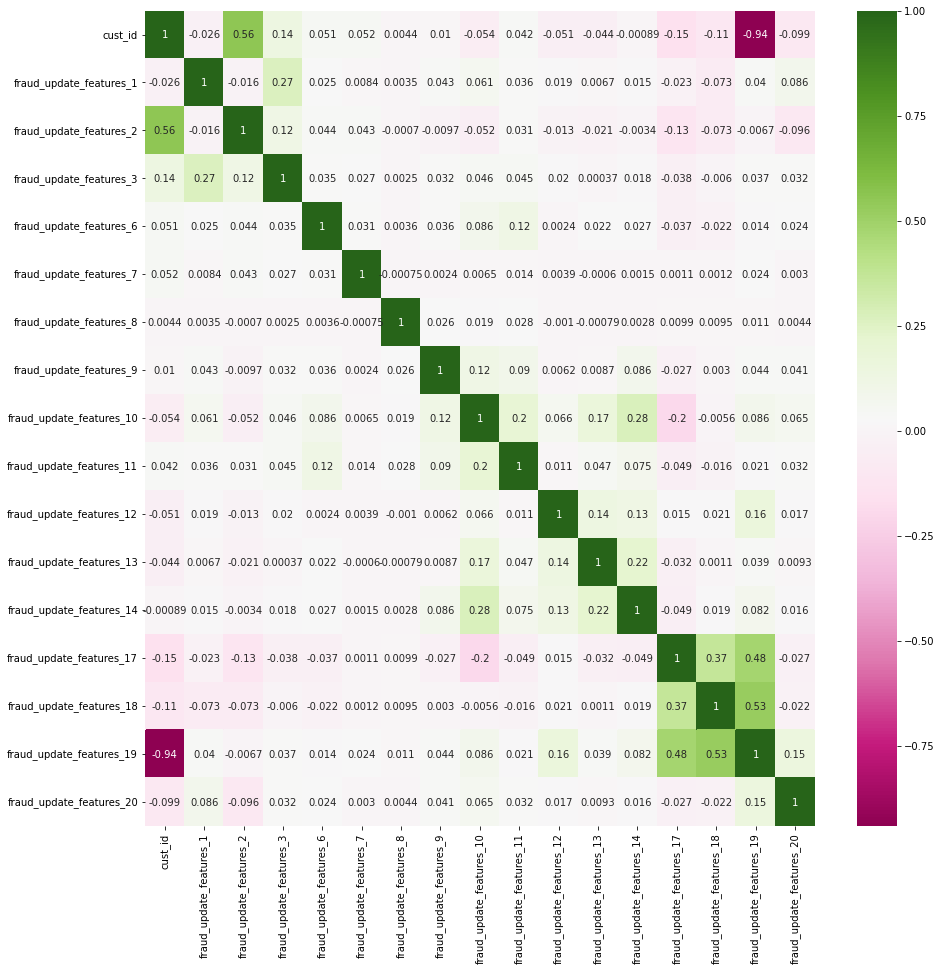

In [ ]:
corr = fraud_update_features.corr()
f, ax = plt.subplots(figsize=(15, 15))

sns.heatmap(corr, annot = True, cmap="PiYG")

### New Account Financial Instruments

In [ ]:
print("Data Types")
print(new_acct_fi.dtypes)

print("")
print("Missing Value")
print(new_acct_fi.isnull().sum())

print("")
print("Null Value")
print(new_acct_fi.isna().sum())

Data Types
cust_id             int64
new_acct_fi_1     float64
new_acct_fi_2     float64
new_acct_fi_3     float64
new_acct_fi_4     float64
new_acct_fi_5     float64
new_acct_fi_6     float64
new_acct_fi_7       int64
new_acct_fi_8       int64
new_acct_fi_9       int64
new_acct_fi_10      int64
new_acct_fi_11      int64
new_acct_fi_12      int64
new_acct_fi_13      int64
new_acct_fi_14      int64
new_acct_fi_15      int64
new_acct_fi_16      int64
new_acct_fi_17      int64
dtype: object

Missing Value
cust_id           0
new_acct_fi_1     0
new_acct_fi_2     0
new_acct_fi_3     0
new_acct_fi_4     0
new_acct_fi_5     0
new_acct_fi_6     0
new_acct_fi_7     0
new_acct_fi_8     0
new_acct_fi_9     0
new_acct_fi_10    0
new_acct_fi_11    0
new_acct_fi_12    0
new_acct_fi_13    0
new_acct_fi_14    0
new_acct_fi_15    0
new_acct_fi_16    0
new_acct_fi_17    0
dtype: int64

Null Value
cust_id           0
new_acct_fi_1     0
new_acct_fi_2     0
new_acct_fi_3     0
new_acct_fi_4     0
new_acc

In [ ]:
new_acct_fi.describe()

,cust_id,new_acct_fi_1,new_acct_fi_2,new_acct_fi_3,new_acct_fi_4,new_acct_fi_5,new_acct_fi_6,new_acct_fi_7,new_acct_fi_8,new_acct_fi_9,new_acct_fi_10,new_acct_fi_11,new_acct_fi_12,new_acct_fi_13,new_acct_fi_14,new_acct_fi_15,new_acct_fi_16,new_acct_fi_17
count,5.691040e+05,569104.000000,569104.000000,569104.000000,569104.000000,569104.000000,569104.000000,569104.000000,569104.000000,569104.000000,569104.0,569104.000000,569104.000000,569104.0,569104.0,569104.0,569104.0,569104.000000
mean,4.068830e+07,699.522656,908.878780,799.422390,687.578510,835.286405,759.912686,0.695412,0.699654,1.513119,0.0,1.513337,0.000958,0.0,0.0,0.0,0.0,1.514296
std,2.793827e+07,562.070366,653.454743,567.118978,555.301279,607.910721,549.720488,0.465434,0.566169,1.185493,0.0,1.185208,0.032752,0.0,0.0,0.0,0.0,1.185358
min,1.080000e+02,2.001852,2.004826,2.004826,3.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.000000
25%,1.618070e+07,243.676878,328.475634,312.165709,235.041667,318.041667,304.041667,0.000000,0.000000,1.000000,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,1.000000
50%,3.654649e+07,580.470897,802.105179,724.476585,574.041667,732.000000,679.041667,1.000000,1.000000,1.000000,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,1.000000
75%,6.322793e+07,1010.213579,1371.140014,1165.279631,992.041667,1213.041667,1067.000000,1.000000,1.000000,2.000000,0.0,2.000000,0.000000,0.0,0.0,0.0,0.0,2.000000
max,9.886928e+07,3572.766817,3572.768206,3572.766817,3628.000000,3628.000000,3628.000000,4.000000,32.000000,253.000000,0.0,253.000000,3.000000,0.0,0.0,0.0,0.0,253.000000


#### Heat Map

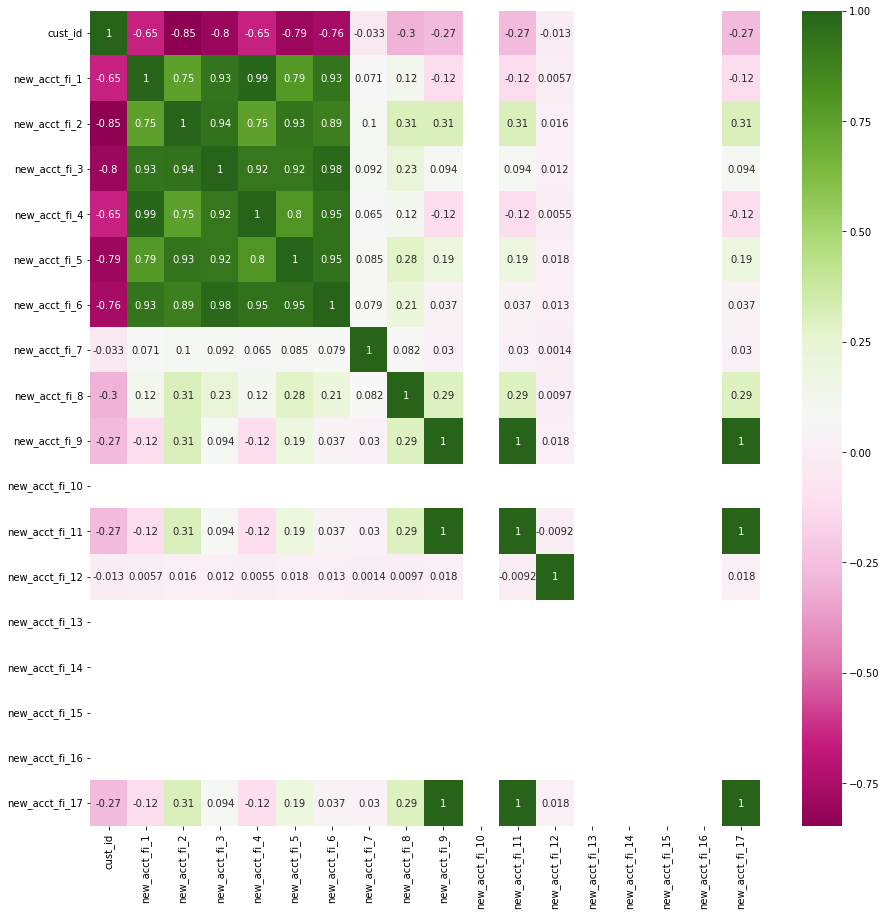

In [ ]:
corr = new_acct_fi.corr()
f, ax = plt.subplots(figsize=(15, 15))

sns.heatmap(corr, annot = True, cmap="PiYG")

### New Account Memo Received

In [ ]:
print("Data Types")
print(new_acct_memo_rcv.dtypes)

print("")
print("Missing Value")
print(new_acct_memo_rcv.isnull().sum())

print("")
print("Null Value")
print(new_acct_memo_rcv.isna().sum())

Data Types
cust_id                   int64
new_acct_memo_rcv_1       int64
new_acct_memo_rcv_2     float64
new_acct_memo_rcv_3     float64
new_acct_memo_rcv_4     float64
new_acct_memo_rcv_5       int64
new_acct_memo_rcv_6     float64
new_acct_memo_rcv_7     float64
new_acct_memo_rcv_8     float64
new_acct_memo_rcv_9       int64
new_acct_memo_rcv_10    float64
new_acct_memo_rcv_11    float64
new_acct_memo_rcv_12    float64
new_acct_memo_rcv_13      int64
new_acct_memo_rcv_14    float64
new_acct_memo_rcv_15    float64
new_acct_memo_rcv_16    float64
new_acct_memo_rcv_17      int64
new_acct_memo_rcv_18    float64
new_acct_memo_rcv_19    float64
new_acct_memo_rcv_20    float64
new_acct_memo_rcv_21      int64
new_acct_memo_rcv_22    float64
new_acct_memo_rcv_23    float64
new_acct_memo_rcv_24    float64
new_acct_memo_rcv_25      int64
new_acct_memo_rcv_26    float64
new_acct_memo_rcv_27    float64
new_acct_memo_rcv_28    float64
new_acct_memo_rcv_29      int64
new_acct_memo_rcv_30    float

In [ ]:
new_acct_memo_rcv.describe()

,cust_id,new_acct_memo_rcv_1,new_acct_memo_rcv_2,new_acct_memo_rcv_3,new_acct_memo_rcv_4,new_acct_memo_rcv_5,new_acct_memo_rcv_6,new_acct_memo_rcv_7,new_acct_memo_rcv_8,new_acct_memo_rcv_9,new_acct_memo_rcv_10,new_acct_memo_rcv_11,new_acct_memo_rcv_12,new_acct_memo_rcv_13,new_acct_memo_rcv_14,new_acct_memo_rcv_15,new_acct_memo_rcv_16,new_acct_memo_rcv_17,new_acct_memo_rcv_18,new_acct_memo_rcv_19,new_acct_memo_rcv_20,new_acct_memo_rcv_21,new_acct_memo_rcv_22,new_acct_memo_rcv_23,new_acct_memo_rcv_24,new_acct_memo_rcv_25,new_acct_memo_rcv_26,new_acct_memo_rcv_27,new_acct_memo_rcv_28,new_acct_memo_rcv_29,new_acct_memo_rcv_30,new_acct_memo_rcv_31,new_acct_memo_rcv_32,new_acct_memo_rcv_33,new_acct_memo_rcv_34,new_acct_memo_rcv_35,new_acct_memo_rcv_36,new_acct_memo_rcv_37,new_acct_memo_rcv_38,new_acct_memo_rcv_39,new_acct_memo_rcv_40,new_acct_memo_rcv_41,new_acct_memo_rcv_42,new_acct_memo_rcv_43,new_acct_memo_rcv_44,new_acct_memo_rcv_45,new_acct_memo_rcv_46,new_acct_memo_rcv_47,new_acct_memo_rcv_48,new_acct_memo_rcv_49,new_acct_memo_rcv_50,new_acct_memo_rcv_51,new_acct_memo_rcv_52
count,7.711480e+05,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000
mean,4.469080e+07,1.600612,68.472490,33.330645,3.021445,0.257962,108.218409,34.886243,3.673628,0.346253,30.701748,15.999209,1.377478,0.519437,48.988043,26.212396,2.002311,0.024521,1.914383,1.222152,0.071263,0.014146,2.617818,1.958250,0.136913,0.013110,1.357626,1.128258,0.081867,0.036447,6.763207,4.485770,0.282365,0.066704,6.206419,3.035505,0.238395,0.032280,1.503593,1.169000,0.073356,0.200973,33.843458,21.800130,1.998781,0.076539,14.350296,10.630015,0.795866,0.487678,44.045875,29.390159,2.301423
std,2.766944e+07,7.098554,395.026717,122.383755,17.482666,1.602295,942.389550,195.126281,36.921825,3.298554,315.723302,97.659474,15.263843,3.341627,479.414626,135.135505,20.613208,0.509723,55.106900,24.799046,2.772931,0.181919,59.874696,36.042286,4.835544,0.370885,41.400649,22.653228,3.033857,0.467146,144.539474,68.649064,6.760846,1.564443,172.084548,42.224053,6.614562,0.467198,37.439580,26.083335,2.715505,1.183370,315.171136,141.521005,26.226906,0.661587,161.708019,93.761429,14.076516,3.675278,242.084394,128.177253,19.093640
min,1.080000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.055555e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.303749e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

#### Heat Map

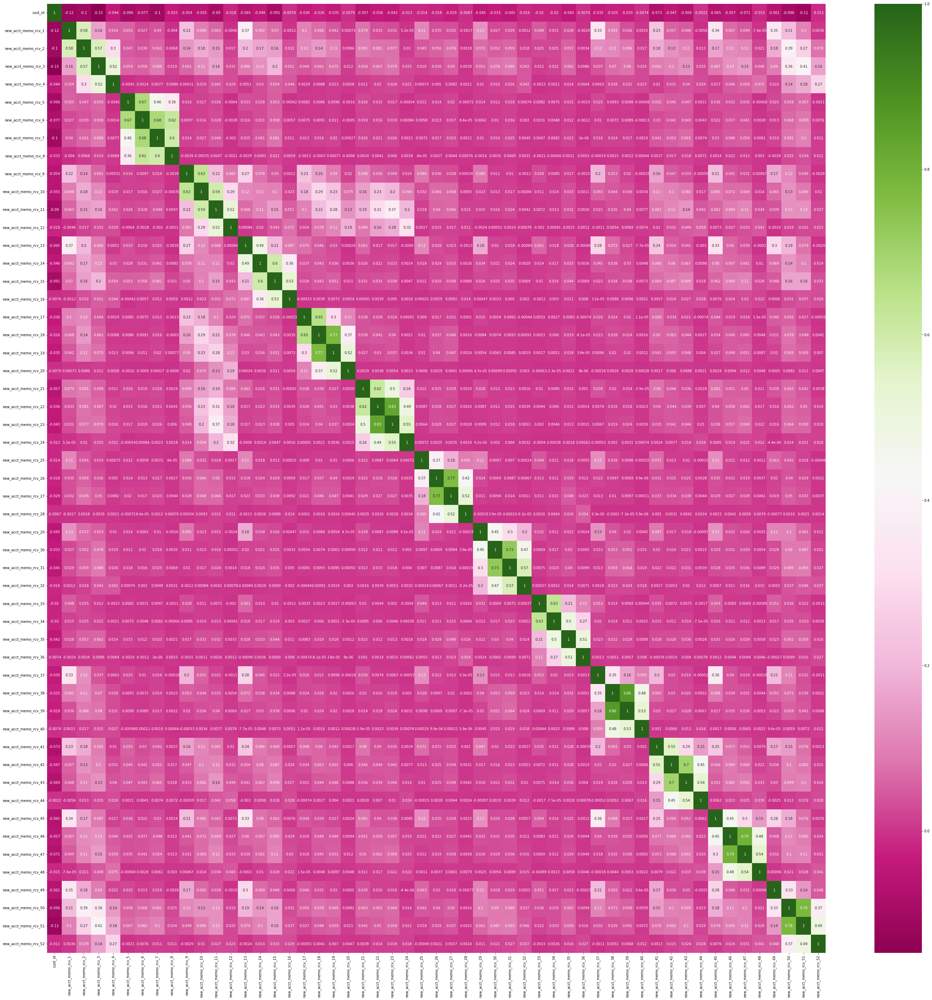

In [ ]:
corr = new_acct_memo_rcv.corr()
f, ax = plt.subplots(figsize=(50, 50))

sns.heatmap(corr, annot = True, cmap="PiYG")

### New Account Memo Sent

In [ ]:
print("Data Types")
print(new_acct_memo_sent.dtypes)

print("")
print("Missing Value")
print(new_acct_memo_sent.isnull().sum())

print("")
print("Null Value")
print(new_acct_memo_sent.isna().sum())

Data Types
cust_id                    int64
new_acct_memo_sent_1       int64
new_acct_memo_sent_2     float64
new_acct_memo_sent_3     float64
new_acct_memo_sent_4     float64
new_acct_memo_sent_5       int64
new_acct_memo_sent_6     float64
new_acct_memo_sent_7     float64
new_acct_memo_sent_8     float64
new_acct_memo_sent_9       int64
new_acct_memo_sent_10    float64
new_acct_memo_sent_11    float64
new_acct_memo_sent_12    float64
new_acct_memo_sent_13      int64
new_acct_memo_sent_14    float64
new_acct_memo_sent_15    float64
new_acct_memo_sent_16    float64
new_acct_memo_sent_17      int64
new_acct_memo_sent_18    float64
new_acct_memo_sent_19    float64
new_acct_memo_sent_20    float64
new_acct_memo_sent_21      int64
new_acct_memo_sent_22    float64
new_acct_memo_sent_23    float64
new_acct_memo_sent_24    float64
new_acct_memo_sent_25      int64
new_acct_memo_sent_26    float64
new_acct_memo_sent_27    float64
new_acct_memo_sent_28    float64
new_acct_memo_sent_29      int64

In [ ]:
new_acct_memo_sent.describe()

,cust_id,new_acct_memo_sent_1,new_acct_memo_sent_2,new_acct_memo_sent_3,new_acct_memo_sent_4,new_acct_memo_sent_5,new_acct_memo_sent_6,new_acct_memo_sent_7,new_acct_memo_sent_8,new_acct_memo_sent_9,new_acct_memo_sent_10,new_acct_memo_sent_11,new_acct_memo_sent_12,new_acct_memo_sent_13,new_acct_memo_sent_14,new_acct_memo_sent_15,new_acct_memo_sent_16,new_acct_memo_sent_17,new_acct_memo_sent_18,new_acct_memo_sent_19,new_acct_memo_sent_20,new_acct_memo_sent_21,new_acct_memo_sent_22,new_acct_memo_sent_23,new_acct_memo_sent_24,new_acct_memo_sent_25,new_acct_memo_sent_26,new_acct_memo_sent_27,new_acct_memo_sent_28,new_acct_memo_sent_29,new_acct_memo_sent_30,new_acct_memo_sent_31,new_acct_memo_sent_32,new_acct_memo_sent_33,new_acct_memo_sent_34,new_acct_memo_sent_35,new_acct_memo_sent_36,new_acct_memo_sent_37,new_acct_memo_sent_38,new_acct_memo_sent_39,new_acct_memo_sent_40,new_acct_memo_sent_41,new_acct_memo_sent_42,new_acct_memo_sent_43,new_acct_memo_sent_44,new_acct_memo_sent_45,new_acct_memo_sent_46,new_acct_memo_sent_47,new_acct_memo_sent_48,new_acct_memo_sent_49,new_acct_memo_sent_50,new_acct_memo_sent_51,new_acct_memo_sent_52
count,8.419750e+05,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000
mean,4.671462e+07,1.436203,61.070584,30.776617,2.094230,0.239028,103.300478,36.970662,3.232684,0.314756,28.240183,16.486352,1.016107,0.465256,42.999733,25.725695,1.500213,0.022073,1.676370,1.078503,0.050197,0.013126,2.493953,2.143316,0.100233,0.011683,1.218070,1.022800,0.052504,0.032319,5.978749,4.583858,0.273583,0.056838,5.195130,3.105199,0.181256,0.029059,1.425985,1.139666,0.049078,0.182150,30.556240,19.888889,1.082719,0.069371,13.115143,10.274865,0.497334,0.438901,39.435834,26.543231,1.558456
std,2.821512e+07,3.921203,317.186898,115.637982,11.716825,1.306476,798.749872,201.023690,32.762577,1.797181,244.829110,96.796502,10.156403,2.039806,349.913881,132.671731,16.003976,0.493315,49.966196,23.407314,2.279357,0.150105,47.349809,36.963782,3.405823,0.165106,35.295354,21.856565,3.230767,0.264437,121.411905,64.536672,8.416116,0.666746,81.821594,38.449521,3.770103,0.304340,38.651652,25.803307,3.151470,1.005931,302.271909,134.613509,13.925885,0.469971,148.577518,89.329030,8.782948,2.078101,257.412888,122.496967,12.359710
min,1.080000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.204283e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.564065e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

#### Heat Map

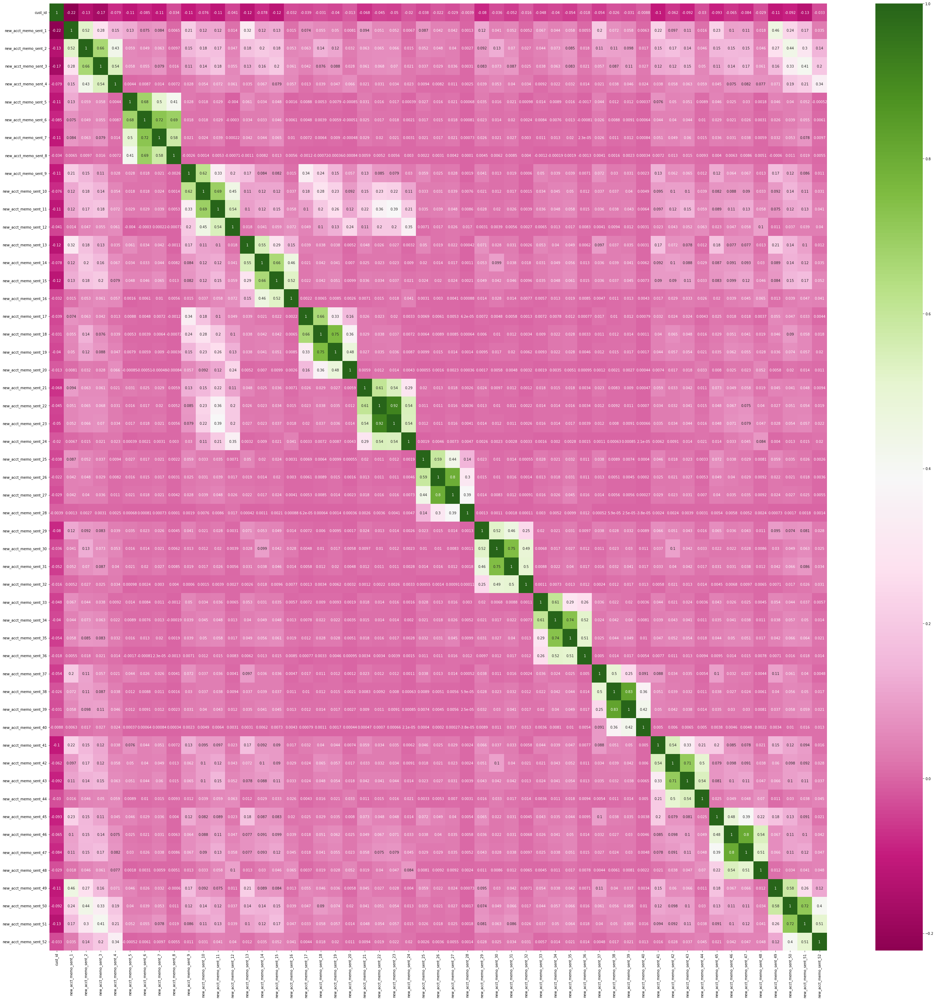

In [ ]:
corr = new_acct_memo_sent.corr()
f, ax = plt.subplots(figsize=(50, 50))

sns.heatmap(corr, annot = True, cmap="PiYG")

### New Account Receiver

In [ ]:
print("Data Types")
print(new_acct_receiver.dtypes)

print("")
print("Missing Value")
print(new_acct_receiver.isnull().sum())

print("")
print("Null Value")
print(new_acct_receiver.isna().sum())

Data Types
cust_id             int64
acct_receiver_1     int64
acct_receiver_2     int64
acct_receiver_3     int64
acct_receiver_4     int64
                    ...  
acct_receiver_76    int64
acct_receiver_77    int64
acct_receiver_78    int64
acct_receiver_79    int64
acct_receiver_80    int64
Length: 81, dtype: object

Missing Value
cust_id             0
acct_receiver_1     0
acct_receiver_2     0
acct_receiver_3     0
acct_receiver_4     0
                   ..
acct_receiver_76    0
acct_receiver_77    0
acct_receiver_78    0
acct_receiver_79    0
acct_receiver_80    0
Length: 81, dtype: int64

Null Value
cust_id             0
acct_receiver_1     0
acct_receiver_2     0
acct_receiver_3     0
acct_receiver_4     0
                   ..
acct_receiver_76    0
acct_receiver_77    0
acct_receiver_78    0
acct_receiver_79    0
acct_receiver_80    0
Length: 81, dtype: int64


In [ ]:
new_acct_receiver.describe()

,cust_id,acct_receiver_1,acct_receiver_2,acct_receiver_3,acct_receiver_4,acct_receiver_5,acct_receiver_6,acct_receiver_7,acct_receiver_8,acct_receiver_9,acct_receiver_10,acct_receiver_11,acct_receiver_12,acct_receiver_13,acct_receiver_14,acct_receiver_15,acct_receiver_16,acct_receiver_17,acct_receiver_18,acct_receiver_19,acct_receiver_20,acct_receiver_21,acct_receiver_22,acct_receiver_23,acct_receiver_24,acct_receiver_25,acct_receiver_26,acct_receiver_27,acct_receiver_28,acct_receiver_29,acct_receiver_30,acct_receiver_31,acct_receiver_32,acct_receiver_33,acct_receiver_34,acct_receiver_35,acct_receiver_36,acct_receiver_37,acct_receiver_38,acct_receiver_39,...,acct_receiver_41,acct_receiver_42,acct_receiver_43,acct_receiver_44,acct_receiver_45,acct_receiver_46,acct_receiver_47,acct_receiver_48,acct_receiver_49,acct_receiver_50,acct_receiver_51,acct_receiver_52,acct_receiver_53,acct_receiver_54,acct_receiver_55,acct_receiver_56,acct_receiver_57,acct_receiver_58,acct_receiver_59,acct_receiver_60,acct_receiver_61,acct_receiver_62,acct_receiver_63,acct_receiver_64,acct_receiver_65,acct_receiver_66,acct_receiver_67,acct_receiver_68,acct_receiver_69,acct_receiver_70,acct_receiver_71,acct_receiver_72,acct_receiver_73,acct_receiver_74,acct_receiver_75,acct_receiver_76,acct_receiver_77,acct_receiver_78,acct_receiver_79,acct_receiver_80
count,7.711480e+05,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,7.711480e+05,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,7.711480e+05,771148.000000,771148.000000,...,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.00000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000,771148.000000
mean,4.469080e+07,8.974259,5.753273,3.467860,1.465690,0.358071,27.408771,15.060042,7.465337,2.373984,0.436768,466.589271,38.029267,133.642466,3.049436e+03,1679.429072,848.130285,271.414084,54.151936,0.991773,0.590661,0.321595,0.107021,0.022639,56.303002,0.774300,7.482932,203.978143,113.663438,56.045156,18.741868,3.813476,26.416998,14.469381,7.143743,2.266963,0.414129,2.845458e+03,1565.765634,792.085129,...,50.338460,131.045692,3.915872,19.306330,465.197999,263.813488,133.617199,43.364979,8.137436,7.833811,4.288091,2.058556,0.659292,0.117556,229.120477,9.596615,47.629474,1120.694613,611.648408,307.297024,99.087661,19.827677,9.483434,5.204936,2.610954,0.834968,0.157017,314.659946,13.25006,66.706662,1463.543686,803.967176,407.216062,128.961443,26.186823,10.091526,5.567014,2.795828,0.879723,0.162196
std,2.766944e+07,36.882247,33.131804,12.716581,4.283012,1.336704,94.316371,73.042691,45.501961,16.510312,4.554884,672.705823,148.019082,228.021182,8.600365e+03,4987.063796,2658.588869,1013.148491,329.541152,48.932279,48.763560,37.969655,14.184136,4.168830,284.519990,35.093347,67.034078,1983.390289,1426.844171,909.402343,443.316945,187.444405,79.174077,53.562595,24.623684,8.287865,1.796362,7.840129e+03,4467.571138,2336.355620,...,252.799452,304.288843,49.846624,69.813450,1884.161288,1162.608261,640.476304,256.377600,79.402888,29.216608,20.015927,9.317468,3.199688,0.750237,463.258216,86.019865,137.108627,4221.165110,2578.648322,1462.938679,619.542284,236.836183,57.096041,52.398649,39.089782,14.563069,4.233819,578

#### Heat Map

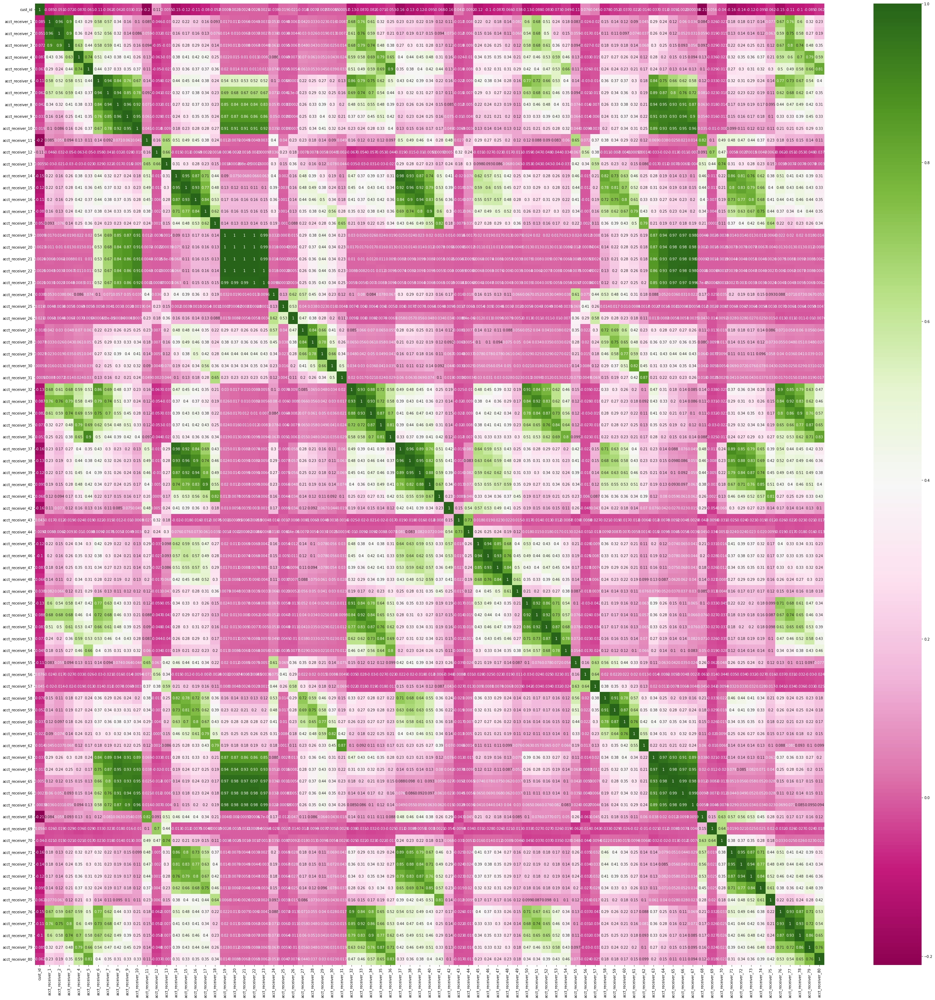

In [ ]:
corr = new_acct_receiver.corr()
f, ax = plt.subplots(figsize=(50, 50))

sns.heatmap(corr, annot = True, cmap="PiYG")

### New Account Sender

In [ ]:
print("Data Types")
print(new_acct_sender.dtypes)

print("")
print("Missing Value")
print(new_acct_sender.isnull().sum())

print("")
print("Null Value")
print(new_acct_sender.isna().sum())

Data Types
cust_id             int64
accnt_sender_1      int64
accnt_sender_2      int64
accnt_sender_3      int64
accnt_sender_4      int64
                    ...  
accnt_sender_107    int64
accnt_sender_108    int64
accnt_sender_109    int64
accnt_sender_110    int64
accnt_sender_111    int64
Length: 112, dtype: object

Missing Value
cust_id             0
accnt_sender_1      0
accnt_sender_2      0
accnt_sender_3      0
accnt_sender_4      0
                   ..
accnt_sender_107    0
accnt_sender_108    0
accnt_sender_109    0
accnt_sender_110    0
accnt_sender_111    0
Length: 112, dtype: int64

Null Value
cust_id             0
accnt_sender_1      0
accnt_sender_2      0
accnt_sender_3      0
accnt_sender_4      0
                   ..
accnt_sender_107    0
accnt_sender_108    0
accnt_sender_109    0
accnt_sender_110    0
accnt_sender_111    0
Length: 112, dtype: int64


In [ ]:
new_acct_sender.describe()

,cust_id,accnt_sender_1,accnt_sender_2,accnt_sender_3,accnt_sender_4,accnt_sender_5,accnt_sender_6,accnt_sender_7,accnt_sender_8,accnt_sender_9,accnt_sender_10,accnt_sender_11,accnt_sender_12,accnt_sender_13,accnt_sender_14,accnt_sender_15,accnt_sender_16,accnt_sender_17,accnt_sender_18,accnt_sender_19,accnt_sender_20,accnt_sender_21,accnt_sender_22,accnt_sender_23,accnt_sender_24,accnt_sender_25,accnt_sender_26,accnt_sender_27,accnt_sender_28,accnt_sender_29,accnt_sender_30,accnt_sender_31,accnt_sender_32,accnt_sender_33,accnt_sender_34,accnt_sender_35,accnt_sender_36,accnt_sender_37,accnt_sender_38,accnt_sender_39,...,accnt_sender_72,accnt_sender_73,accnt_sender_74,accnt_sender_75,accnt_sender_76,accnt_sender_77,accnt_sender_78,accnt_sender_79,accnt_sender_80,accnt_sender_81,accnt_sender_82,accnt_sender_83,accnt_sender_84,accnt_sender_85,accnt_sender_86,accnt_sender_87,accnt_sender_88,accnt_sender_89,accnt_sender_90,accnt_sender_91,accnt_sender_92,accnt_sender_93,accnt_sender_94,accnt_sender_95,accnt_sender_96,accnt_sender_97,accnt_sender_98,accnt_sender_99,accnt_sender_100,accnt_sender_101,accnt_sender_102,accnt_sender_103,accnt_sender_104,accnt_sender_105,accnt_sender_106,accnt_sender_107,accnt_sender_108,accnt_sender_109,accnt_sender_110,accnt_sender_111
count,8.419750e+05,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.00000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,...,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000,841975.000000
mean,4.671462e+07,8.583997,5.542890,3.414690,1.503083,0.391734,0.166071,0.118280,0.087665,0.053339,0.025245,33.429020,18.462793,9.247810,2.932783,0.544230,470.421171,22.474262,106.501594,2881.216489,1586.339455,801.193361,257.903306,50.937150,4.590563,2.700559,1.417549,0.45374,0.091782,17.013916,0.087675,1.504599,148.754374,89.806800,48.076563,15.531326,3.066115,0.653544,0.355721,0.177373,...,0.178028,190.240414,7.708066,38.833227,1008.729525,546.514590,272.750143,88.892528,17.340598,8.934101,4.819990,2.385962,0.754489,0.138749,271.234340,10.136987,55.364416,1303.402728,710.536227,358.835754,114.072531,23.178927,9.180010,5.030500,2.526545,0.797993,0.146365,13.063472,0.045289,1.097486,132.436243,80.895420,43.505420,14.075563,2.805668,3.923550,2.341375,1.235588,0.395803,0.081088
std,2.821512e+07,9.644678,6.360588,4.063968,2.077058,0.808394,0.511425,0.407323,0.336558,0.249008,0.163731,59.541939,34.731530,18.339353,6.433978,1.513281,670.027272,110.062761,182.779313,5953.235337,3535.148734,1917.893460,782.375478,276.053757,32.296731,19.858645,10.894039,3.77808,0.889370,93.820321,4.941027,8.901160,1273.203261,798.105097,445.889829,159.271769,40.030164,3.550536,2.400466,1.523826,...,0.732013,450.248538,69.290604,119.963331,3511.733284,2138.903771,1186.952134,540.744409,204.006850,22.327748,13.068204,6.890925,2.480682,0.636453,571.876222,80.849761,143.699777,3606.607652,2077.808817,1116.514433,428.118743,156.371458,19.637473,11.217474,5.921056,2.129090,0.546079,89.955113,3.372912,7.410304,1253.093889,786.437268,439.353334,156.051748,39.383469,31.010469,19.133260,10.506055,3

#### Heat Map

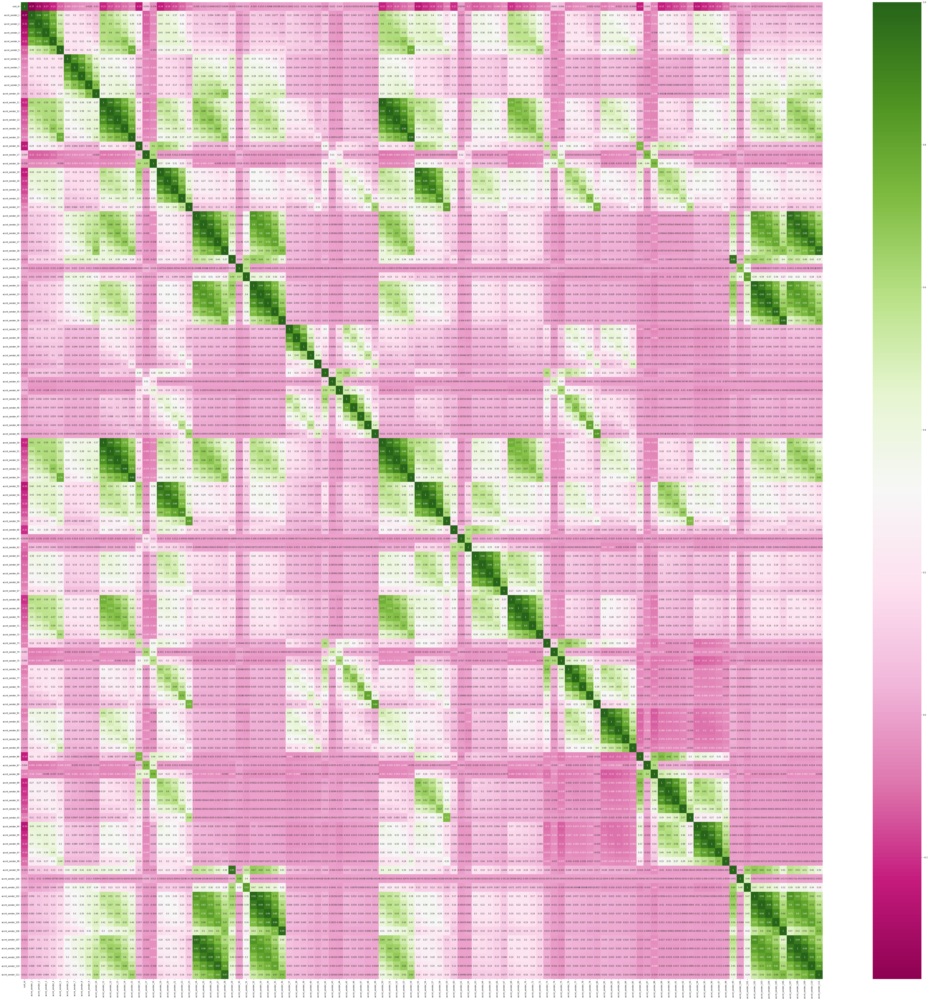

In [ ]:
corr = new_acct_sender.corr()
f, ax = plt.subplots(figsize=(90, 90))

sns.heatmap(corr, annot = True, cmap="PiYG")

### Payment Cashout Faliure

In [ ]:
print("Data Types")
print(payment_cashout_fail_df.dtypes)

print("")
print("Missing Value")
print(payment_cashout_fail_df.isnull().sum())

print("")
print("Null Value")
print(payment_cashout_fail_df.isna().sum())

Data Types
cust_id                      int64
payment_cashout_fail_1     float64
payment_cashout_fail_2     float64
payment_cashout_fail_3     float64
payment_cashout_fail_4     float64
payment_cashout_fail_5     float64
payment_cashout_fail_6     float64
payment_cashout_fail_7     float64
payment_cashout_fail_8     float64
payment_cashout_fail_9       int64
payment_cashout_fail_10      int64
payment_cashout_fail_11      int64
payment_cashout_fail_12      int64
payment_cashout_fail_13      int64
payment_cashout_fail_14      int64
payment_cashout_fail_15    float64
payment_cashout_fail_16    float64
payment_cashout_fail_17    float64
payment_cashout_fail_18    float64
payment_cashout_fail_19    float64
payment_cashout_fail_20    float64
payment_cashout_fail_21    float64
payment_cashout_fail_22    float64
payment_cashout_fail_23      int64
payment_cashout_fail_24      int64
payment_cashout_fail_25      int64
payment_cashout_fail_26      int64
payment_cashout_fail_27      int64
payment_c

In [ ]:
payment_cashout_fail_df.describe()

,cust_id,payment_cashout_fail_1,payment_cashout_fail_2,payment_cashout_fail_3,payment_cashout_fail_4,payment_cashout_fail_5,payment_cashout_fail_6,payment_cashout_fail_7,payment_cashout_fail_8,payment_cashout_fail_9,payment_cashout_fail_10,payment_cashout_fail_11,payment_cashout_fail_12,payment_cashout_fail_13,payment_cashout_fail_14,payment_cashout_fail_15,payment_cashout_fail_16,payment_cashout_fail_17,payment_cashout_fail_18,payment_cashout_fail_19,payment_cashout_fail_20,payment_cashout_fail_21,payment_cashout_fail_22,payment_cashout_fail_23,payment_cashout_fail_24,payment_cashout_fail_25,payment_cashout_fail_26,payment_cashout_fail_27,payment_cashout_fail_28,payment_cashout_fail_29,payment_cashout_fail_30,payment_cashout_fail_31,payment_cashout_fail_32,payment_cashout_fail_33,payment_cashout_fail_34,payment_cashout_fail_35,payment_cashout_fail_36,payment_cashout_fail_37,payment_cashout_fail_38,payment_cashout_fail_39,payment_cashout_fail_40,payment_cashout_fail_41,payment_cashout_fail_42,payment_cashout_fail_43,payment_cashout_fail_44,payment_cashout_fail_45,payment_cashout_fail_46,payment_cashout_fail_47,payment_cashout_fail_48,payment_cashout_fail_49,payment_cashout_fail_50,payment_cashout_fail_51,payment_cashout_fail_52,payment_cashout_fail_53,payment_cashout_fail_54,payment_cashout_fail_55,payment_cashout_fail_56
count,4.997800e+04,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,5397.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,43313.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,49978.000000,47171.000000
mean,4.735481e+07,936.331666,265.109234,179.285717,220.352505,478.162896,223.710962,67.875807,13.237605,3.823062,1.974029,0.912842,0.287587,0.058906,163.178899,125.572857,42.800654,21.679819,30.327370,75.688484,40.415738,10.504994,2.344897,0.349834,0.206931,0.103466,0.029173,0.007703,154.917176,789.002806,216.172601,134.250941,172.896699,389.932723,176.373990,54.799648,10.549999,3.398315,1.727540,0.789407,0.251831,0.050282,164.367419,914.575662,247.884860,161.567822,203.224068,465.621206,216.789728,65.304642,12.894896,3.748149,1.934471,0.892873,0.281004,0.057986,162.776982
std,2.549230e+07,4066.063538,484.197664,370.823157,406.347713,2581.429106,1963.190990,732.637960,261.607366,9.125325,5.151801,3.435980,1.892395,0.577724,104.032407,1176.529348,240.247656,161.051724,184.048659,990.185613,756.030082,263.392834,127.678576,2.426021,1.376121,0.883379,0.405740,0.193437,101.302234,3802.018889,437.876851,315.110152,352.985924,2312.190534,1751.150011,656.077992,209.157805,8.648635,4.898847,3.281811,1.816548,0.516813,104.357966,4059.880482,471.758149,351.288714,390.039242,2572.922288,1958.391610,728.432949,260.668094,9.138555,5.152671,3.433347,1.889199,0.576951,104.047537
min,2.412600e+04,0.010000,0.010000,0.010000,0.010000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,2.657328e+07,48.760000,29.700000,19.750000,28.667500,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,74.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

#### Heat Map

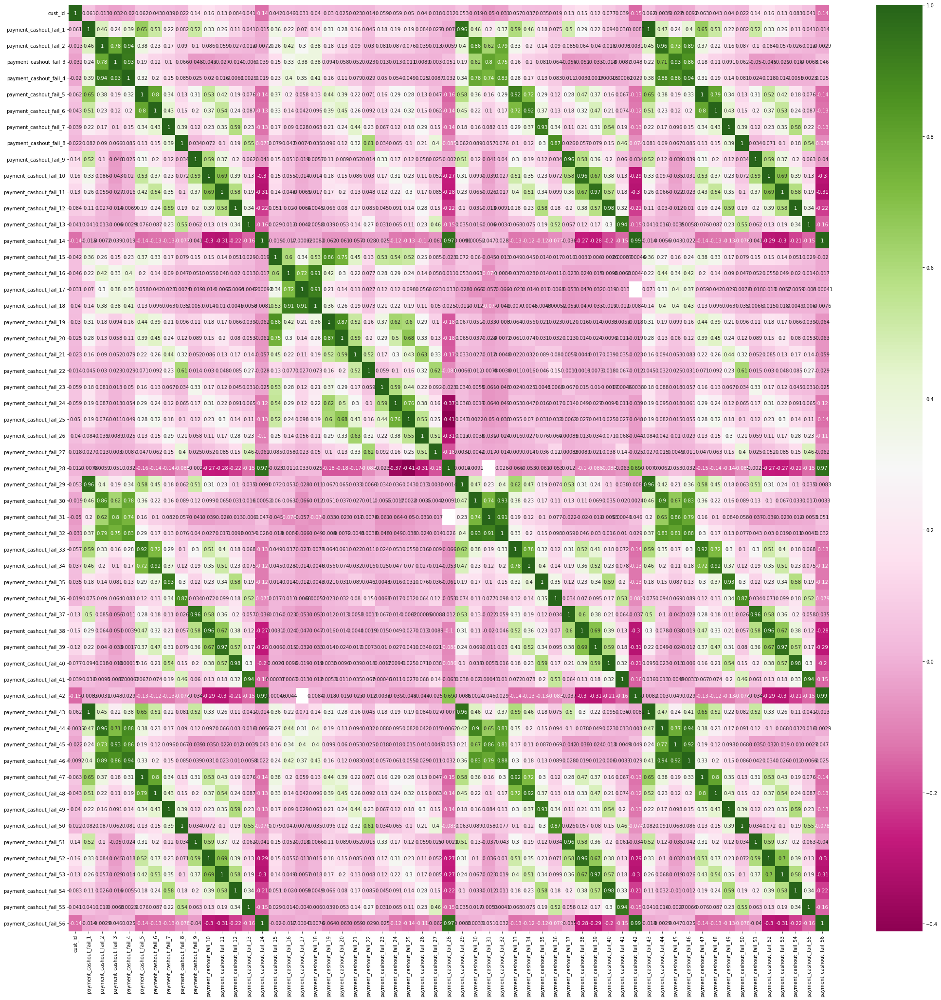

In [ ]:
corr = payment_cashout_fail_df.corr()
f, ax = plt.subplots(figsize=(35, 35))

sns.heatmap(corr, annot = True, cmap="PiYG")

### Train Dataframe

In [ ]:
train_df.head()

,cust_id,target
0,46006086,0.0
1,13494269,0.0
2,58609039,0.0
3,14920847,0.0
4,59616399,1.0


In [ ]:
train_df.describe()

,cust_id,target
count,7.200000e+05,720000.000000
mean,4.773126e+07,0.111111
std,2.845521e+07,0.314270
min,1.080000e+02,0.000000
25%,2.286166e+07,0.000000
50%,4.696107e+07,0.000000
75%,7.281299e+07,0.000000
max,9.899213e+07,1.000000


### Test Dataframe

In [ ]:
test_cust_id.head()

,cust_id
0,26570415
1,73696303
2,46327032
3,40194630
4,18735326


# Part 2: Data Preprocessing

## Feature Elimination

### Removing dates and feature with most nulls

In [ ]:
fraud_update_features.drop(fraud_update_features.columns[[4, 5, 15, 16]], inplace = True, axis = 1)
payment_cashout_fail_df.drop(payment_cashout_fail_df.columns[28], inplace = True, axis = 1)

### Imputation:

Filling null values with median so that we can run PCA

In [ ]:
def fill_null_median(X):
  for i in range(X.shape[1]):
      m = X[X.columns[i]].median()
      X[X.columns[i]] = X[X.columns[i]].fillna(m)

In [ ]:
for X in dfs:
  fill_null_median(X)

### Saving customer id:

saving customer id and dropping it for each data frame as they can affect PCA. We will add them back after PCA.

In [ ]:
cust_ids = []
def save_cust(X):
  cust_ids.append(X['cust_id'])
  X.drop('cust_id',axis=1,inplace=True)

In [ ]:
for X in dfs:
  save_cust(X)

### PCA:

Running PCA after applying standard scaling to reduce number of features to half in each data frame.

In [ ]:
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import StandardScaler

pca_dfs = []
def run_pca(X):
  scaler = StandardScaler()
  scaler.fit(X)
  X_scaled = scaler.transform(X)
  pca = PCA(n_components=(X_scaled.shape[1]//2), whiten='True')
  X1 = pca.fit(X_scaled).transform(X_scaled)

  X1_df = pd.DataFrame(X1)
  pca_dfs.append(X1_df)

In [ ]:
for X in dfs:
  run_pca(X)

### Adding back customer ids

In [ ]:
def add_cust_id(i):
  cid = []
  for j in range(len(cust_ids[i])):
    cid.append(cust_ids[i].iat[j])
  pca_dfs[i]['cust_id'] = cid
  dfs[i]['cust_id'] = cid

In [ ]:
for i in range(7):
  add_cust_id(i)

## Merging Data Frames


In [ ]:
training_full_df = pd.merge(left = train_df, right = dfs[0], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[1], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[2], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[3], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[4], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[5], how = "left", on = "cust_id")
training_full_df = pd.merge(left = training_full_df, right = dfs[6], how = "left", on = "cust_id")
training_full_df.head()

In [ ]:
training_half_df = pd.merge(left = train_df, right = pca_dfs[0], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[1], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[2], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[3], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[4], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[5], how = "left", on = "cust_id")
training_half_df = pd.merge(left = training_half_df, right = pca_dfs[6], how = "left", on = "cust_id")
training_half_df.describe()

In [ ]:
test_full_df = pd.merge(left = test_cust_id, right = dfs[0], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[1], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[2], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[3], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[4], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[5], how = "left", on = "cust_id")
test_full_df = pd.merge(left = test_full_df, right = dfs[6], how = "left", on = "cust_id")
test_full_df.describe()

In [ ]:
test_half_df = pd.merge(left = test_cust_id, right = pca_dfs[0], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[1], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[2], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[3], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[4], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[5], how = "left", on = "cust_id")
test_half_df = pd.merge(left = test_half_df, right = pca_dfs[6], how = "left", on = "cust_id")
test_half_df.describe()

## Obtaining target values and dropping cust_ids

In [ ]:
train_targets = training_full_df["target"]
train_cust_id = training_full_df["cust_id"]

training_full_df.drop(["target", "cust_id"], inplace = True, axis = 1)
training_half_df.drop(["target", "cust_id"], inplace = True, axis = 1)

test_cust_id = test_full_df["cust_id"]

test_full_df.drop("cust_id", inplace = True, axis = 1)
test_half_df.drop("cust_id", inplace = True, axis = 1)

## Renaming columns as after PCA some columns have same name

In [ ]:
def rename_cols(X):
  new_name = []
  x = 1

  while x<=X.shape[1]:
    new_name.append(str(x))
    x+=1

  X.columns=new_name

In [ ]:
rename_cols(training_full_df)
rename_cols(training_half_df)
rename_cols(test_full_df)
rename_cols(test_half_df)

## Final imputation after merging all Data Frames

In [ ]:
fill_null_median(training_full_df)
fill_null_median(training_half_df)

fill_null_median(test_full_df)
fill_null_median(test_half_df)

# Part 3: Models we used


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
!pip install catboost
from catboost import CatBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import lightgbm as lgb 
from sklearn.model_selection import RandomizedSearchCV

## splitting traing and validation for both full and half(after PCA) data frames

In [ ]:
X_full_train, X_full_val, Y_full_train, Y_full_val = train_test_split(training_full_df, train_targets, test_size = 0.2, random_state = 0)
X_half_train, X_half_val, Y_half_train, Y_half_val = train_test_split(training_half_df, train_targets, test_size = 0.2, random_state = 0)

## Training and Validation

### We tried 5 different models.

And for most of them, we ran randomized search CV for both full and half data frames to find best set of parameters

### LDA : Linear Discriminant Analysis

In [ ]:
clf_lda_full = LinearDiscriminantAnalysis()
clf_lda_full.fit(X_full_train, Y_full_train)
Y_lda_full_prob = clf_lda_full.predict_proba(X_full_val)
Y_lda_full_prob = pd.DataFrame(Y_lda_full_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_full_val, Y_lda_full_prob["p"]))

In [ ]:
clf_lda_half = LinearDiscriminantAnalysis()
clf_lda_half.fit(X_half_train, Y_half_train)
Y_lda_half_prob = clf_lda_half.predict_proba(X_half_val)
Y_lda_half_prob = pd.DataFrame(Y_lda_half_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_half_val, Y_lda_half_prob["p"]))

### Catboost : Categorical Boosting

#### Randomized Search CV

In [ ]:
clf_rsc = CatBoostClassifier()

param_grid = {
        'loss_function': ['Logloss', 'CrossEntropy'],
        'l2_leaf_reg':np.logspace(-20, -19, 3),
        'iterations':[250,100,500,1000],
        'depth': [3, 4, 5, 6, 7, 8, 9, 10],
        'learning_rate':[0.03,0.001,0.01,0.1,0.2,0.3],
        'border_count':[32,5,10,20,50,100,200],
        'task_type': ["GPU"]}

rs_clf = RandomizedSearchCV(clf_rsc, param_grid, n_iter=10,
                            n_jobs=1, verbose=2, cv=2,
                            scoring='roc_auc', refit=True, random_state=0)

rs_clf.fit(X_full_train,Y_full_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

In [ ]:
rs_clf.fit(X_half_train,Y_half_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

#### Model Training

In [ ]:
clf_cat_full = CatBoostClassifier(border_count=50, depth = 4, iterations= 500, l2_leaf_reg =  1e-19, learning_rate= 0.3, loss_function= 'CrossEntropy', task_type = 'GPU')
clf_cat_full.fit(X_full_train, Y_full_train, eval_set = (X_full_val, Y_full_val), verbose = False)
Y_cat_full_prob = clf_cat_full.predict_proba(X_full_val)
Y_cat_full_prob = pd.DataFrame(Y_cat_full_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_full_val, Y_cat_full_prob["p"]))

In [ ]:
clf_cat_half = CatBoostClassifier(border_count=50, depth = 4, iterations= 500, l2_leaf_reg =  1e-19, learning_rate= 0.3, loss_function= 'CrossEntropy', task_type = 'GPU')
clf_cat_half.fit(X_half_train, Y_half_train, eval_set = (X_half_val, Y_half_val), verbose = False)
Y_cat_half_prob = clf_cat_half.predict_proba(X_half_val)
Y_cat_half_prob = pd.DataFrame(Y_cat_half_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_half_val, Y_cat_half_prob["p"]))

### xgboost : Extreme Gradient Boosting

#### Randomized Search CV

In [ ]:
clf_rsc = xgb.XGBClassifier()

param_grid = {
        'silent': [False],
        'max_depth': [6, 10, 15, 20],
        'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3, 0.6],
        'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'min_child_weight': [0.5, 1.0, 3.0, 5.0, 7.0, 10.0],
        'gamma': [0, 0.25, 0.5, 1.0],
        'reg_lambda': [0.1, 1.0, 5.0, 10.0, 50.0, 100.0],
        'n_estimators': [75, 100, 125]}

rs_clf = RandomizedSearchCV(clf_rsc, param_grid, n_iter=20,
                            n_jobs=1, verbose=2, cv=2,
                            scoring='roc_auc', refit=True, random_state=42)

rs_clf.fit(X_full_train,Y_full_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

In [ ]:
rs_clf.fit(X_half_train,Y_half_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

#### Model training

In [ ]:
clf_xgb_full = xgb.XGBClassifier(objective = 'binary:logistic', eval_metric = "auc", missing = None, random_state = 0, max_depth = 8, eta = 0.1, gamma = 0.05)
clf_xgb_full.fit(X_full_train, Y_full_train)
Y_xgb_full_prob = clf_xgb_full.predict_proba(X_full_val)
Y_xgb_full_prob = pd.DataFrame(Y_xgb_full_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_full_val, Y_xgb_full_prob["p"]))

In [ ]:
clf_xgb_half = xgb.XGBClassifier(objective = 'binary:logistic', eval_metric = "auc", missing = None, random_state = 0, max_depth = 8, eta = 0.1, gamma = 0.05)
clf_xgb_half.fit(X_half_train, Y_half_train)
Y_xgb_half_prob = clf_xgb_half.predict_proba(X_half_val)
Y_xgb_half_prob = pd.DataFrame(Y_xgb_half_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_half_val, Y_xgb_half_prob["p"]))

### Random Forest Classifier

In [ ]:
clf_rfc_full = RandomForestClassifier(n_estimators = 30, random_state = 0, n_jobs = -1)
clf_rfc_full.fit(X_full_train, Y_full_train)
Y_rfc_full_prob = clf_rfc_full.predict_proba(X_full_val)
Y_rfc_full_prob = pd.DataFrame(Y_rfc_full_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_full_val, Y_rfc_full_prob["p"]))

In [ ]:
clf_rfc_half = RandomForestClassifier(n_estimators = 30, random_state = 0, n_jobs = -1)
clf_rfc_half.fit(X_half_train, Y_half_train)
Y_rfc_half_prob = clf_rfc_half.predict_proba(X_half_val)
Y_rfc_half_prob = pd.DataFrame(Y_rfc_half_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_half_val, Y_rfc_half_prob["p"]))

### Lightgbm : Light Gradient Boosting Machine

#### Randomized Search CV

In [ ]:
import lightgbm as lgb 
from sklearn.model_selection import RandomizedSearchCV

clf_rsc = lgb.LGBMClassifier()

params = {}
params['learning_rate'] = [0.001, 0.003, 0.01, 0.1, 0.3]
params['boosting_type'] = ['gbdt', 'dart', 'goss']
params['sub_feature'] = [0.001, 0.003, 0.01, 0.1, 0.3]
params['num_leaves'] = [20, 50, 100, 200, 300]
params['min_data_in_leaf'] = [50, 100, 300, 1000, 3000]
params['min_data'] = [10, 20, 50, 100, 200]
params['max_depth'] = [5, 8, 10, 20, 50, 100, 200]

rs_clf = RandomizedSearchCV(clf_rsc, params, n_iter=20,
                            n_jobs=1, verbose=2, cv=2,
                          refit=True, random_state=42, scoring='roc_auc')

rs_clf.fit(X_full_train,Y_full_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

In [ ]:
rs_clf.fit(X_half_train,Y_half_train)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

#### Model training

In [ ]:
clf_lgb_full = lgb.LGBMClassifier(boosting_type= 'dart',
learning_rate= 0.1,
max_depth= 20,
min_data= 50,
min_data_in_leaf= 300,
num_leaves= 200,
sub_feature= 0.3) 
clf_lgb_full.fit(X_full_train,Y_full_train,eval_set=[(X_full_val,Y_full_val)], verbose=20,eval_metric='auc')
Y_lgb_full_prob = clf_lgb_full.predict_proba(X_full_val)
Y_lgb_full_prob = pd.DataFrame(Y_lgb_full_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_full_val, Y_lgb_full_prob["p"]))

In [ ]:
clf_lgb_half = lgb.LGBMClassifier(boosting_type= 'dart',
learning_rate= 0.1,
max_depth= 20,
min_data= 50,
min_data_in_leaf= 300,
num_leaves= 200,
sub_feature= 0.3) 
clf_lgb_half.fit(X_half_train,Y_half_train,eval_set=[(X_half_val,Y_half_val)], verbose=20,eval_metric='auc')
Y_lgb_half_prob = clf_lgb_half.predict_proba(X_half_val)
Y_lgb_half_prob = pd.DataFrame(Y_lgb_half_prob, columns = ["p0", "p"])
print(roc_auc_score(Y_half_val, Y_lgb_half_prob["p"]))

## Weighted Average of different model's predictions

We finally decided to take weightage average of 3 best performing models(xgboost, lgbm and catboost) to figure out the combination which gives best roc score in validation.

In [ ]:
roc_full_xgb_lgbm_cb = []
weights = []
temp = pd.DataFrame()
for i in range(11):
  for j in range(11):
    for k in range(11):
      if i+j+k==0:
        continue
      temp['target']=(i*Y_xgb_full_prob['p'] + j*Y_lgb_full_prob['p'] + k*Y_cat_full_prob['p'])/(i+j+k)
      roc_full_xgb_lgbm_cb.append(roc_auc_score(train_targets, temp['target']))
      weights.append([i,j,k])

In [ ]:
n = len(roc_full_xgb_lgbm_cb)
max_i = -1
max = 0
for i in range(n):
  if roc_full_xgb_lgbm_cb[i]>max:
    max_i = i
    max = roc_full_xgb_lgbm_cb[i]

print(max,weights[max_i])

In [ ]:
roc_half_xgb_lgbm_cb = []
weights = []
temp = pd.DataFrame()
for i in range(0,11):
  for j in range(0,11):
    for k in range(0,11):
      if i+j+k==0:
        continue
      temp['target']=(i*Y_xgb_half_prob['p'] + j*Y_lgb_half_prob['p'] + k*Y_cat_half_prob['p'])/(i+j+k)
      roc_half_xgb_lgbm_cb.append(roc_auc_score(train_targets, temp['target']))
      weights.append([i,j,k])

In [ ]:
n = len(roc_half_xgb_lgbm_cb)
max_i = -1
max = 0
for i in range(n):
  if roc_half_xgb_lgbm_cb[i]>max:
    max_i = i
    max = roc_half_xgb_lgbm_cb[i]

print(max,weights[max_i])

## Running on test_df

### LDA : Linear Discriminant Analysis

In [ ]:
clf_lda_full = LinearDiscriminantAnalysis()
clf_lda_full.fit(training_full_df, train_targets)
Y_lda_full_prob_test = clf_lda_full.predict_proba(test_full_df)
Y_lda_full_prob_test = pd.DataFrame(Y_lda_full_prob_test, columns = ["p0", "p"])
Y_lda_full_prob_test.to_csv('/content/drive/MyDrive/MS4610/lda_full_sub.csv')

In [ ]:
clf_lda_half = LinearDiscriminantAnalysis()
clf_lda_half.fit(training_half_df, train_targets)
Y_lda_half_prob_test = clf_lda_half.predict_proba(test_half_df)
Y_lda_half_prob_test = pd.DataFrame(Y_lda_half_prob_test, columns = ["p0", "p"])
Y_lda_half_prob_test.to_csv('/content/drive/MyDrive/MS4610/lda_half_sub.csv')

### Catboost : Categorical Boosting

In [ ]:
clf_cat_full = CatBoostClassifier(border_count=50, depth = 4, iterations= 500, l2_leaf_reg =  1e-19, learning_rate= 0.3, loss_function= 'CrossEntropy', task_type = 'GPU')
clf_cat_full.fit(training_full_df, train_targets, verbose = False)
Y_cat_full_prob_test = clf_cat_full.predict_proba(test_full_df)
Y_cat_full_prob_test = pd.DataFrame(Y_cat_full_prob_test, columns = ["p0", "p"])
Y_cat_full_prob_test.to_csv('/content/drive/MyDrive/MS4610/cat_full_sub.csv')

In [ ]:
clf_cat_half = CatBoostClassifier(border_count=50, depth = 4, iterations= 500, l2_leaf_reg =  1e-19, learning_rate= 0.3, loss_function= 'CrossEntropy', task_type = 'GPU')
clf_cat_half.fit(training_half_df, train_targets, verbose = False)
Y_cat_half_prob_test = clf_cat_half.predict_proba(test_half_df)
Y_cat_half_prob_test = pd.DataFrame(Y_cat_half_prob_test, columns = ["p0", "p"])
Y_cat_half_prob_test.to_csv('/content/drive/MyDrive/MS4610/cat_half_sub.csv')

### xgboost : Extreme Gradient Boosting

In [ ]:
clf_xgb_full = xgb.XGBClassifier(objective = 'binary:logistic', eval_metric = "auc", missing = None, random_state = 0, max_depth = 8, eta = 0.1, gamma = 0.05)
clf_xgb_full.fit(training_full_df, train_targets)
Y_xgb_full_prob_test = clf_xgb_full.predict_proba(test_full_df)
Y_xgb_full_prob_test = pd.DataFrame(Y_xgb_full_prob_test, columns = ["p0", "p"])
Y_xgb_full_prob_test.to_csv('/content/drive/MyDrive/MS4610/xgb_full_sub.csv')

In [ ]:
clf_xgb_half = xgb.XGBClassifier(objective = 'binary:logistic', eval_metric = "auc", missing = None, random_state = 0, max_depth = 8, eta = 0.1, gamma = 0.05)
clf_xgb_half.fit(training_half_df, train_targets)
Y_xgb_half_prob_test = clf_xgb_half.predict_proba(test_half_df)
Y_xgb_half_prob_test = pd.DataFrame(Y_xgb_half_prob_test, columns = ["p0", "p"])
Y_xgb_half_prob_test.to_csv('/content/drive/MyDrive/MS4610/xgb_half_sub.csv')

### Random Forest Classifier

In [ ]:
clf_rfc_full = RandomForestClassifier(n_estimators = 30, random_state = 0, n_jobs = -1)
clf_rfc_full.fit(training_full_df, train_targets)
Y_rfc_full_prob_test = clf_rfc_full.predict_proba(test_full_df)
Y_rfc_full_prob_test = pd.DataFrame(Y_rfc_full_prob_test, columns = ["p0", "p"])
Y_rfc_full_prob_test.to_csv('/content/drive/MyDrive/MS4610/rfc_full_sub.csv')

In [ ]:
clf_rfc_half = RandomForestClassifier(n_estimators = 30, random_state = 0, n_jobs = -1)
clf_rfc_half.fit(training_half_df, train_targets)
Y_rfc_half_prob_test = clf_rfc_half.predict_proba(test_half_df)
Y_rfc_half_prob_test = pd.DataFrame(Y_rfc_half_prob_test, columns = ["p0", "p"])
Y_rfc_half_prob_test.to_csv('/content/drive/MyDrive/MS4610/rfc_half_sub.csv')

### Lightgbm : Light Gradient Boosting Machine

In [ ]:
clf_lgb_full = lgb.LGBMClassifier(boosting_type= 'dart',
learning_rate= 0.1,
max_depth= 20,
min_data= 50,
min_data_in_leaf= 300,
num_leaves= 200,
sub_feature= 0.3) 
clf_lgb_full.fit(training_full_df,train_targets, verbose=20,eval_metric='auc')
Y_lgb_full_prob_test = clf_lgb_full.predict_proba(test_full_df)
Y_lgb_full_prob_test = pd.DataFrame(Y_lgb_full_prob_test, columns = ["p0", "p"])
Y_lgb_full_prob_test.to_csv('/content/drive/MyDrive/MS4610/lgb_full_sub.csv')

In [ ]:
clf_lgb_half = lgb.LGBMClassifier(boosting_type= 'dart',
learning_rate= 0.1,
max_depth= 20,
min_data= 50,
min_data_in_leaf= 300,
num_leaves= 200,
sub_feature= 0.3) 
clf_lgb_half.fit(training_half_df,train_targets, verbose=20,eval_metric='auc')
Y_lgb_half_prob_test = clf_lgb_half.predict_proba(test_half_df)
Y_lgb_half_prob_test = pd.DataFrame(Y_lgb_half_prob_test, columns = ["p0", "p"])
Y_lgb_half_prob_test.to_csv('/content/drive/MyDrive/MS4610/lgb_half_sub.csv')

# Part 4 : Final Submission


After all submissions and weighted averages we came to conclusion that (5*full_xgb + half_lgbm + half_cat)/7 performs best in roc_auc score.

In [ ]:
result = pd.DataFrame()

In [ ]:
result['cust_id'] = test_cust_id
result['target'] = (5*Y_xgb_full_prob_test['p'] + Y_lgb_half_prob_test['p'] + Y_cat_half_prob_test['p'])/7

In [ ]:
result.head()

In [ ]:
result.to_csv('/content/drive/MyDrive/MS4610/final_submission.csv')